In [18]:
from pprint import pprint
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
import seaborn as sn
import utils
from joblib import dump, load
from matplotlib import colors
from osgeo import gdal
from skimage import exposure
from skimage.util import img_as_ubyte
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
import time
import matplotlib
from skimage.feature import graycomatrix, graycoprops
from skimage.measure import shannon_entropy
from matplotlib.colors import ListedColormap
from rasterio.enums import Resampling

In [4]:
#get file directory

import os
current_directory = os.getcwd()
print(current_directory)

C:\Users\gille\Desktop\Masters_Drone


## Image Pre-processing Steps: Supervised Classification

A reference dataset was created for training and evaluation of the ML algorithm. This is achieved by manually classifying a selection of images, and then using some of them for training and some for evaluation. 

- In ArcPro, I manually digitized small subsets of the entire drone image (4 - 100 sq. meter sample images) with the following land cover classes: 

     
| Classification Schema | Severity Ranking | 
| --- | --- |
| Green Vegetation | 0 - No Burn Impact |
| Bare Soil | 0 - No Burn Impact |
| Burnt Woody Vegetation (Standing) | 1 - Low Severity |
| Charred Vegetation & Soil | 2 - Med Severity |
| Gray Ash | 3 - High Severity |
| White Ash | 3 - High Severity |

- Once the model is running, the land cover classifications will be reclassified to their correlating burn severity ranking for the final classification map.


- Shadow was also manually classified, but does not correlate to a burn severity classification, and can therefore be thought of an Null for this project.


- There are 4 manually digitized images that will be used to train the model, and then the entire drone image will be used as the test image.


### Preprocessing steps included: 
- Manual digitization of land cover classes
- Conversion to raster files
- Reclassification & inital resampling to match spatial resolution of RGB drone imagery (0.46 x 0.46 cm)


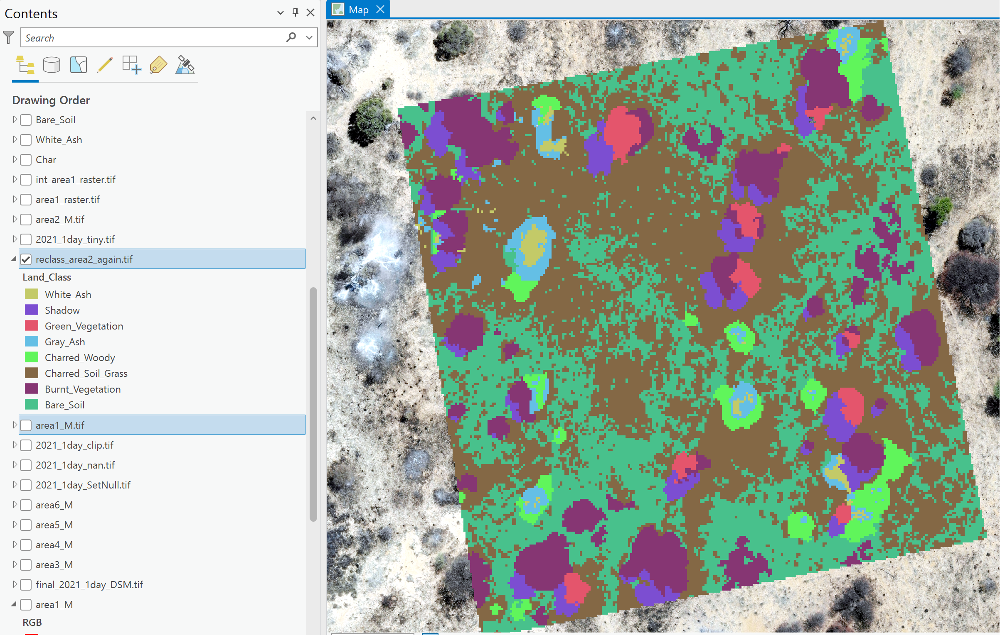

## Visualize drone imagery vs. the manual burn severity classifications 

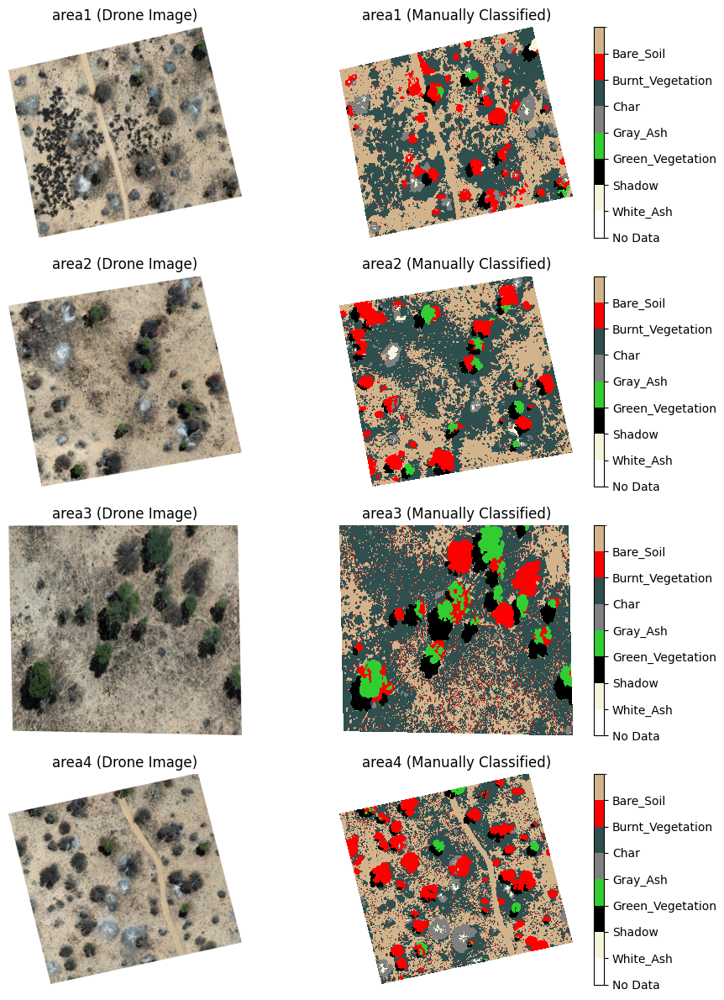

In [20]:
from matplotlib.colors import ListedColormap
# Setup plot
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 12))

# Class Codes
class_codes = {
    0: "No Data",
    1: "White_Ash",
    2: "Shadow",
    3: "Green_Vegetation",
    4: "Gray_Ash",
    5: "Char",
    6: "Burnt_Vegetation",
    7: "Bare_Soil",
    15: "NoData"
}

# Color Map
cmap = colors.ListedColormap(
    ["white", "beige", "black", "limegreen", "grey", "darkslategrey", "red", "tan"],
    N=len(class_codes) - 1  # Exclude the last color for NoData
)

# BoundaryNorm for discrete colors
norm = colors.BoundaryNorm(boundaries=np.arange(0, len(class_codes)), ncolors=len(class_codes))

# Manually classified image names
fnames = ["area1", "area2", "area3", "area4"]

# Loop over data
for idx, name in enumerate(fnames):
    # Paths to images
    raw_path = r"C:\Users\gille\Desktop\Masters_Drone\%s_raw_y.tif" % name
    man_path = r"C:\Users\gille\Desktop\Masters_Drone\%s_manual_nocw_re.tif" % name

    # Read raw bands to arrays
    with rasterio.open(raw_path) as src:
        # Read each band separately
        band1 = src.read(1)
        band2 = src.read(2)
        band3 = src.read(3)

        # Get nodata value, EPSG code, and extent
        ndv = src.nodata
        epsg = src.crs.to_epsg() if src.crs else None
        extent = src.bounds

        # Stack the bands using numpy
        raw_img_area = np.dstack((band1, band2, band3))

    with rasterio.open(man_path) as src:
        # Read the single band
        man_img_area = src.read(1)

        # Get nodata value, EPSG code, and extent
        ndv = src.nodata
        man_epsg = src.crs.to_epsg() if src.crs else None
        extent = src.bounds

    # NaN changed to float
    man_img_area = man_img_area.astype(np.float64)

    a = man_img_area
    man_img_area = np.ma.array(a, mask=np.isnan(a))

    # Plot
    # Raw image
    raw_img_area[raw_img_area == 0] = 255
    axes[idx, 0].imshow(raw_img_area)
    axes[idx, 0].set_title("%s (Drone Image)" % name, fontsize=12)

    # Manually classified using imshow
    man_img_area[man_img_area == 15] = 0  # Set NoData to the first color (white) in the color map
    img = axes[idx, 1].imshow(man_img_area, cmap=cmap, norm=norm, interpolation='none')
    axes[idx, 1].set_title("%s (Manually Classified)" % name, fontsize=12)

    # Turn off axes
    axes[idx, 0].axis("off")
    axes[idx, 1].axis("off")

    # Colorbar for manual dataset
    cb = plt.colorbar(img, ax=axes[idx, 1], ticks=np.arange(0, len(class_codes) - 1), boundaries=np.arange(0, len(class_codes)))
    cb.set_ticklabels(list(class_codes.values())[:-1])  # Exclude the last label (NoData)

plt.tight_layout()
plt.show()
 

# Training the model:
- All images (raw RGB and manually classified) were resampled to ensure the dimensions are matching prior to training the mode. 

### I will take a standard ML approach and split the data into three portions: one for training, one for evaluation and a third for testing. I will split the data as follows: 
- Data from the first four images (area1_raw_y, area2_raw_y, area3_raw_y, area4_raw_y) will be pooled, and then split 70:30 at random to create the training and evaluation datasets, respectively. 
- Additional variables will be used within X dataset including: Excessive Greenness Index, Char Index, Canopy Height Models, Brightness Index, & Green Chromatic Coordinate Index.
- The entire image is withheld as a completely independent image for testing the fitted algorithm at the end of the process.

## Canopy Height Model Input & Resampling

In [72]:
def resample_raster(input_path, output_path, target_height, target_width, nodata_value):
    with rasterio.open(input_path) as src:
        transform = src.transform
        profile = src.profile
        profile.update(width=target_width, height=target_height, transform=transform)

        data = src.read(
            out_shape=(src.count, target_height, target_width),
            resampling=Resampling.bilinear
        )

        # Replace NoData values
        data[data == nodata_value] = profile['nodata']

    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(data)

# List of file names for DSM images
fnames = ['area1', 'area2', 'area3', 'area4']

# Define the main RGB image for resampling
main_rgb_path = r'C:\Users\gille\Desktop\Masters_Drone\area1_raw_y.tif'
with rasterio.open(main_rgb_path) as main_rgb_src:
    target_height, target_width = main_rgb_src.height, main_rgb_src.width

for name in fnames:
    dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_DSM.tif' % name
    resampled_dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_DSM_re.tif' % name

    # Resample DSM and save it using the dimensions of the main RGB image
    resample_raster(dsm_path, resampled_dsm_path, target_height, target_width, -3.4028235e+38)


## Begin Training Model:

**X Variables**: RGB images, texture variables dervived from Gray-Level Co-occurence Matrix (mean, homogeneity, correlation, & entropy), RGB spectral indicies (EGI, CI, BI, GCC), and Canopy Height Models for each RGB image. The X variable (or feature matrix) consists of all the input variables used to train the model. These are the factors or characteristics of the landscape that the model will use to make predictions about burn severity.

**Y Variable**: Manually classified dataset. The Y variable (or target variable) is what the model is trying to predict, this is the variable that the model will learn to predict based on the information provided in the X variables.

| RGB Spectral Indices | Equation | 
| --- | --- |
| Excess Green Index (EGI) | 2 × G − R − B |
| Green Chromatic Coordinate Index (GCC) | G/(G + R + B) |
| Char Index (CI) | BI + (MaxDiff × 15) |
| Brightness Index (BI) | R + G + B |
| Maximum RGB Difference (MaxDiff) | Max (absolute_diff(B − G, B − R, R − G)) |

In [33]:
# Define a function to compute texture features
def compute_texture_features(image):
    # Compute texture features using GLCM (Grey-Level Co-occurrence Matrix)
    glcm = graycomatrix(image, distances=[5], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, prop='contrast')[0, 0]
    energy = graycoprops(glcm, prop='energy')[0, 0]
    homogeneity = graycoprops(glcm, prop='homogeneity')[0, 0]
    correlation = graycoprops(glcm, prop='correlation')[0, 0]
    return contrast, energy, homogeneity, correlation

# Define a function to compute Excessive Greenness Index (EGI)
def compute_egi(r, g, b):
    egi = (2 * g - r - b) 
    return egi

#Function to compute Green Chromatic Coordinate Index (GCC)
def compute_gcc(r, g, b):
    gcc = g / (r + g + b + 1e-9)  # Adding a small epsilon to avoid division by zero
    return gcc

#Function to compute brightness index
def compute_bi(r, g, b):
    bi = r + g + b
    return bi

#Function to compute max difference 
def compute_max_diff(r, g, b):
    max_diff = np.max([np.abs(b - g), np.abs(b - r), np.abs(r - g)], axis=0)
    return max_diff

#Function to compute the Char Index
def compute_ci(bi, max_diff):
    ci = bi + (max_diff * 15)
    return ci

# Containers for data
y_list = []
r_list = []
g_list = []
b_list = []
contrast_list = []
energy_list = []
homogeneity_list = []
correlation_list = []
egi_list = []
dsm_list = []
brightness_list = []
gcc_list = []
bi_list = []
max_diff_list = []
ci_list = []

# Loop over data for images
for name in fnames[:4]:
    # Paths to images
    raw_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_raw_y.tif' % name
    man_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_manual_nocw_re.tif' % name
    dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_DSM_re.tif' % name
    
    # Read raw bands to arrays using rasterio
    with rasterio.open(raw_path) as src:
        band1 = src.read(1)
        band2 = src.read(2)
        band3 = src.read(3)
    
    # Read manually classified data (1 band only) using rasterio
    with rasterio.open(man_path) as src:
        man_img = src.read(1)
    
    # Read resampled DSM data
    with rasterio.open(dsm_path) as src:
        dsm_band = src.read(1)
    
#     # Apply shadow mask by thresholding the red band at 70
#     shadow_mask = band1 > 70
#     band1_masked = np.where(shadow_mask, 0, band1)
    
    # Compute texture features for each band
    contrast, energy, homogeneity, correlation = compute_texture_features(band1)
    
    # Compute Excessive Greenness Index
    egi = compute_egi(band1, band2, band3)
    
    # Compute additional indices
    gcc = compute_gcc(band1, band2, band3)
    bi = compute_bi(band1, band2, band3)
    max_diff = compute_max_diff(band1, band2, band3)
    ci = compute_ci(bi, max_diff)
    
    # Flatten to 1D and append all pixels
    y_list.append(man_img.flatten())
    r_list.append(band1.flatten())
    g_list.append(band2.flatten())
    b_list.append(band3.flatten())
    contrast_list.append(np.full_like(band1.flatten(), contrast))
    energy_list.append(np.full_like(band1.flatten(), energy))
    homogeneity_list.append(np.full_like(band1.flatten(), homogeneity))
    correlation_list.append(np.full_like(band1.flatten(), correlation))
    egi_list.append(egi.flatten())
    dsm_list.append(dsm_band.flatten())
    gcc_list.append(gcc.flatten())
    bi_list.append(bi.flatten())
    max_diff_list.append(max_diff.flatten())
    ci_list.append(ci.flatten())

# Concatenate to a single dataset
y = np.concatenate(y_list)
r = np.concatenate(r_list)
g = np.concatenate(g_list)
b = np.concatenate(b_list)
contrast = np.concatenate(contrast_list)
energy = np.concatenate(energy_list)
homogeneity = np.concatenate(homogeneity_list)
correlation = np.concatenate(correlation_list)
egi = np.concatenate(egi_list)
dsm = np.concatenate(dsm_list)
gcc = np.concatenate(gcc_list)
bi = np.concatenate(bi_list)
max_diff = np.concatenate(max_diff_list)
ci = np.concatenate(ci_list)

# Build dataframe
df = pd.DataFrame({
    'y': y,
    'r': r,
    'g': g,
    'b': b,
    'contrast': contrast,
    'energy': energy,
    'homogeneity': homogeneity,
    'correlation': correlation,
    'egi': egi,
    'dsm': dsm,
    'gcc': gcc,
    'bi': bi,
    'max_diff': max_diff,
    'ci': ci
})

# Split into training and evaluation
X_train, X_eval, y_train, y_eval = train_test_split(
    df[['r', 'g', 'b', 'contrast', 'energy','homogeneity', 'correlation', 'egi', 'dsm', 'gcc', 'bi', 'max_diff','ci']],
    df['y'],
    test_size=0.3,
    random_state=42
)

# Checking
assert len(X_train) == len(y_train)
assert len(X_eval) == len(y_eval)
print('Number of training samples:', len(X_train))

Number of training samples: 20531761


## Visualization of RGB spectral indices & canopy height model:

#### **Excessive Greenness Index (EGI):**

- Higher Values: Areas with higher EGI values typically indicate the presence of healthy green vegetation. 
    - It is important to note that within this analysis, the white ash and shadow appear to have been classified as the highest EGI values. Shadows and white ash can introduce spectral anomalies and distortions that may influence the calculation of EGI values.
- Lower Values: Lower EGI values suggest the presence of less green vegetation. 

#### **Char Index (CI):**

- Higher Values: Higher CI values are indicative of areas with a high concentration of char, which typically results from the incomplete combustion of biomass or organic material. 
- Lower Values: Lower CI values represent areas with fewer charred materials and are often associated with non-burnt land cover types.

**Shadows:**

- Shadows cast by trees can result in areas of reduced reflectance in the image. When calculating EGI, these shadowed areas may be misclassified as high EGI values because of the reduced green reflectance compared to the surrounding vegetation. Shadows may cause spectral distortions, leading to differences in reflectance values between the green band and other bands. A shadow mask was applied as a threshold of 70 on the red band when calculating CI and EGI, which was visually seen to helo reduce the misclassification of shadows, but the mask was not able to 100% rectify the impact of shadows on the EGI classification.  

**White Ash:**

- White ash can significantly alter the reflectance properties of the surface. White ash deposits may appear as highly reflective white areas in aerial imagery, similar to clouds or snow. White ash deposits may be incorrectly classified as high EGI values due to their high reflectance in the green spectral band. Additionally, the presence of white ash deposits can affect the overall spectral signature of the scene, potentially leading to spectral distortions and inaccuracies in EGI calculations. 

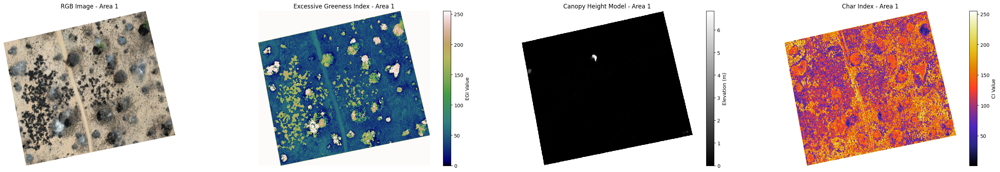

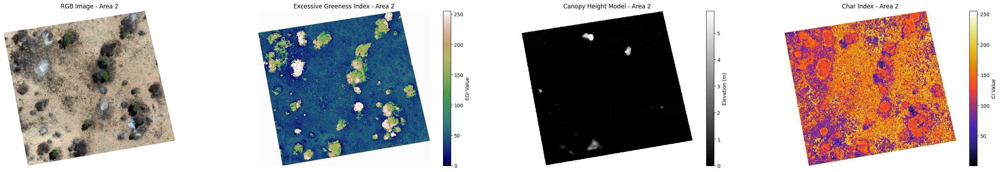

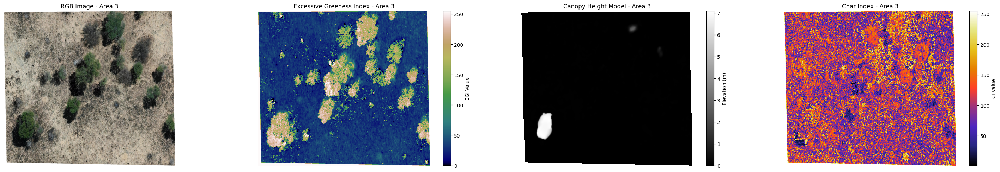

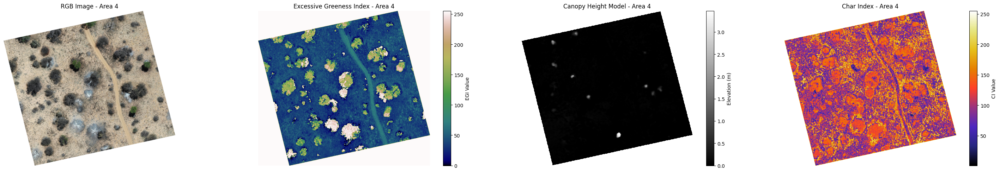

In [64]:
# Define a function to compute Excessive Greenness Index (EGI)
def compute_egi(r, g, b):
    egi = (2 * (g - r - b))
    return egi

# Function to compute max difference 
def compute_max_diff(r, g, b):
    max_diff = np.max([np.abs(b - g), np.abs(b - r), np.abs(r - g)], axis=0)
    return max_diff

# Function to compute the Char Index
def compute_ci(bi, max_diff):
    ci = bi + (max_diff * 15)
    return ci

# Containers for data
r_list = []
g_list = []
b_list = []
egi_list = []
dsm_list = []
ci_list = []

# Loop over data for images
for name in fnames[:4]:
    # Paths to images
    raw_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_raw_y.tif' % name
    dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\%s_DSM_re.tif' % name
    
    # Read raw bands to arrays using rasterio
    with rasterio.open(raw_path) as src:
        band1 = src.read(1)
        band2 = src.read(2)
        band3 = src.read(3)
    
    # Read resampled DSM data
    with rasterio.open(dsm_path) as src:
        dsm_band = src.read(1)
        profile = src.profile  # Get metadata
        
    # Mask no-data values in DSM
    dsm_band = np.ma.masked_equal(dsm_band, profile['nodata'])
    
    # Apply shadow mask by thresholding the red band at 70
    shadow_mask = band1 > 70
    band1_masked = np.where(shadow_mask, 0, band1)
    
    # Compute Excessive Greenness Index
    egi = compute_egi(band1_masked, band2, band3)
    
    # Compute additional indices
    max_diff = compute_max_diff(band1_masked, band2, band3)
    bi = band1_masked + band2 + band3
    ci = compute_ci(bi, max_diff)
    
    # Append images and indices to lists
    r_list.append(band1)
    g_list.append(band2)
    b_list.append(band3)
    egi_list.append(egi)
    dsm_list.append(dsm_band)
    ci_list.append(ci)

# Display images for areas 1-4
for i, area_num in enumerate(['Area 1', 'Area 2', 'Area 3', 'Area 4'], start=1):
    # Stack RGB bands and handle no-data values
    rgb_image = np.dstack((r_list[i-1], g_list[i-1], b_list[i-1]))  
    rgb_image[rgb_image == 0] = 255  # Set black pixels to white
    
    # Plot RGB Image
    plt.figure(figsize=(30, 5))
    plt.subplot(1, 4, 1)
    plt.imshow(rgb_image)
    plt.title('RGB Image - ' + area_num)
    plt.axis('off')
    
    # Plot Excessive Greenness Index
    plt.subplot(1, 4, 2)
    egi_image = egi_list[i-1]
    egi_image[egi_image == 0] = 255  # Set black pixels to white
    
    # Threshold EGI at value 12
    threshold_value = 12
    egi_thresholded = np.where(egi_image >= threshold_value, egi_image, 0)
    
    plt.imshow(egi_thresholded, cmap='gist_earth')
    plt.title('Excessive Greeness Index - ' + area_num)
    plt.colorbar(label='EGI Value')
    plt.axis('off')
    
    # Plot Canopy Height Model (DSM)
    plt.subplot(1, 4, 3)
    dsm_image = dsm_list[i-1]
    plt.imshow(dsm_image, cmap='gray')
    plt.title('Canopy Height Model - ' + area_num)
    plt.colorbar(label='Elevation (m)')
    plt.axis('off')
    
    # Plot Char Index
    plt.subplot(1, 4, 4)
    ci_image = ci_list[i-1]
    ci_image[ci_image == 0] = 255  # Set black pixels to white
    plt.imshow(ci_image, cmap='CMRmap')
    plt.title('Char Index - ' + area_num)
    plt.colorbar(label='CI Value')
    plt.axis('off')
    
    plt.tight_layout()  
    plt.show()

### Training & Prediction

In [34]:
%%time

# Fit classifier to training data (70% split)
classifier = RandomForestClassifier(n_jobs=-1, n_estimators=10)
classifier.fit(X_train, y_train)

CPU times: total: 39min 25s
Wall time: 7min 32s


RandomForestClassifier(n_estimators=10, n_jobs=-1)

In [35]:
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
                       oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

RandomForestClassifier(max_features='auto', n_estimators=10, n_jobs=-1)

In [36]:
%%time

# Predict classes for remaining 30% of data
preds = classifier.predict(X_eval)

CPU times: total: 2min 13s
Wall time: 27.8 s


### Evaluation of the Model

In [37]:
# Only use relevant labels from the training dataset
class_labels = [1, 2, 3, 4, 5, 6, 7]
target_names = [class_codes[i] for i in class_labels]

# Print metrics
print("Classification report:\n%s" %
      metrics.classification_report(y_eval, preds, 
                                    labels=class_labels, 
                                    target_names=target_names))

print("Classification accuracy: %f" %
      metrics.accuracy_score(y_eval, preds))

Classification report:
                  precision    recall  f1-score   support

       White_Ash       0.67      0.61      0.64     31456
          Shadow       0.72      0.66      0.69    335801
Green_Vegetation       0.90      0.89      0.90    205292
        Gray_Ash       0.63      0.62      0.63    204054
            Char       0.74      0.77      0.75   3020229
Burnt_Vegetation       0.55      0.47      0.51    765148
       Bare_Soil       0.77      0.78      0.78   2282545

       micro avg       0.73      0.73      0.73   6844525
       macro avg       0.71      0.68      0.70   6844525
    weighted avg       0.73      0.73      0.73   6844525

Classification accuracy: 0.791431


### Breakdown of the stats above:

Precision (P) is defined as the number of true positives (Tp) over the number of true positives plus the number of false positives (Fp).

- **Precision is the ability of the classifier not to label as positive a sample that is negative.**

Recall (R) is defined as the number of true positives (Tp) over the number of true positives plus the number of false negatives (Fn).

- **Recall is the ability of the classifier to find all the positive samples.**

These quantities are also related to the F1 score, which is defined as the harmonic mean of precision and recall.

For each class, it gives an overall indication of performance, where precision and recall are weighted equally.

In [38]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix',
                          cmap='coolwarm'):

    import itertools
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar(shrink=0.6)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

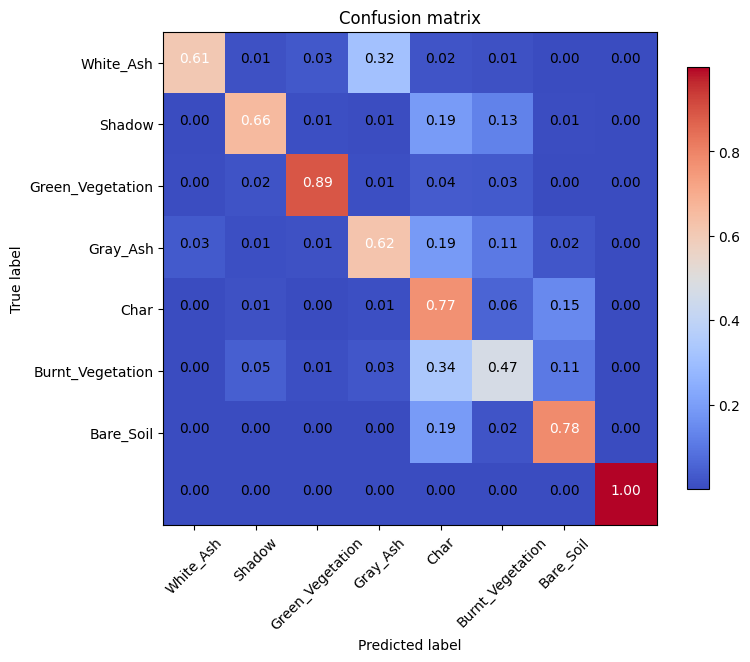

In [39]:
# Confusion matrix    
fig = plt.figure(figsize=(8,8))
fig.add_subplot(111)
cm = metrics.confusion_matrix(y_eval, preds)
plot_confusion_matrix(cm, classes=target_names, normalize=True)

## Predictions with the test (entire) image!


In [26]:
#Need to upload the test image correlating DSM and resample it to match the test area dimensions 

def resample_raster(input_path, output_path, target_height, target_width, nodata_value):
    with rasterio.open(input_path) as src:
        transform = src.transform
        profile = src.profile
        profile.update(width=target_width, height=target_height, transform=transform)

        data = src.read(
            out_shape=(src.count, target_height, target_width),
            resampling=Resampling.bilinear
        )

        # Replace NoData values
        data[data == nodata_value] = profile['nodata']

    with rasterio.open(output_path, 'w', **profile) as dst:
        dst.write(data)

# Define the file path for the DSM you want to resample
dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test_dsm.tif'
resampled_dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test_DSM_re.tif'

# Define the main RGB image for resampling
main_rgb_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test_y.tif'
with rasterio.open(main_rgb_path) as main_rgb_src:
    target_height, target_width = main_rgb_src.height, main_rgb_src.width

# Resample the specified DSM using the dimensions of the main RGB image
resample_raster(dsm_path, resampled_dsm_path, target_height, target_width, -3.4028235e+38)


In [40]:
# Define a function to compute texture features
def compute_texture_features(image):
    # Compute texture features using GLCM (Grey-Level Co-occurrence Matrix)
    glcm = graycomatrix(image, distances=[5], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, prop='contrast')[0, 0]
    energy = graycoprops(glcm, prop='energy')[0, 0]
    homogeneity = graycoprops(glcm, prop='homogeneity')[0, 0]
    correlation = graycoprops(glcm, prop='correlation')[0, 0]
    return contrast, energy, homogeneity, correlation

# Define a function to compute Excessive Greenness Index (EGI)
def compute_egi(r, g, b):
    egi = (2 * g - r - b) 
    return egi

# Function to compute Green Chromatic Coordinate Index (GCC)
def compute_gcc(r, g, b):
    gcc = g / (r + g + b + 1e-9)  # Adding a small epsilon to avoid division by zero
    return gcc

# Function to compute brightness index
def compute_bi(r, g, b):
    bi = r + g + b
    return bi

# Function to compute max difference 
def compute_max_diff(r, g, b):
    max_diff = np.max([np.abs(b - g), np.abs(b - r), np.abs(r - g)], axis=0)
    return max_diff

# Function to compute the Char Index
def compute_ci(bi, max_diff):
    ci = bi + (max_diff * 15)
    return ci

# Path to the new test image
new_test_image_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test_y.tif'

# Container for data
data_dict_test = {}

with rasterio.open(new_test_image_path) as src:
    for band in range(1, 4):
        data = src.read(band)
        data_dict_test[str(band)] = data.flatten()

# Read resampled DSM data
dsm_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test_DSM_re.tif'
with rasterio.open(dsm_path) as src:
    dsm_band = src.read(1)

data_dict_test['dsm'] = dsm_band.flatten()

# Build DataFrame for the new test image
df_test = pd.DataFrame(data_dict_test)
del data_dict_test

# Rename columns to match the names used during training
df_test.columns = ['r', 'g', 'b', 'dsm']

# Compute texture features for the new test image
contrast_test, energy_test, homogeneity_test, correlation_test = compute_texture_features(df_test[['r', 'g', 'b']].values)

# Compute Excessive Greenness Index
egi_test = compute_egi(df_test['r'], df_test['g'], df_test['b'])

# Compute additional indices
gcc_test = compute_gcc(df_test['r'], df_test['g'], df_test['b'])
bi_test = compute_bi(df_test['r'], df_test['g'], df_test['b'])
max_diff_test = compute_max_diff(df_test['r'], df_test['g'], df_test['b'])
ci_test = compute_ci(bi_test, max_diff_test)

# Add computed features to the DataFrame
# Add computed features to the DataFrame
df_test['contrast'] = contrast_test
df_test['energy'] = energy_test
df_test['homogeneity'] = homogeneity_test
df_test['correlation'] = correlation_test
df_test['egi'] = egi_test
df_test['gcc'] = gcc_test
df_test['bi'] = bi_test
df_test['max_diff'] = max_diff_test
df_test['ci'] = ci_test

# Set chunk size for processing
chunk_size = 10000

# Split DataFrame into chunks
chunks = np.array_split(df_test, len(df_test) // chunk_size + 1)

chunk_res = []

for chunk in chunks:
    # Make predictions on the test data chunk
    chunk_res.append(classifier.predict(chunk[['r', 'g', 'b', 'contrast', 'energy', 'homogeneity', 'correlation', 'egi', 'dsm', 'gcc', 'bi', 'max_diff', 'ci']]))

# Concatenate predictions from all chunks
all_preds = np.concatenate(chunk_res)

# Print predictions for the new test image
print('Predictions for the new test image:', all_preds)

C:\Users\gille\anaconda3\envs\Py310\lib\site-packages\numpy\core\fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


Predictions for the new test image: [15 15 15 ... 15 15 15]


## Visualize the model predicted classification map: 

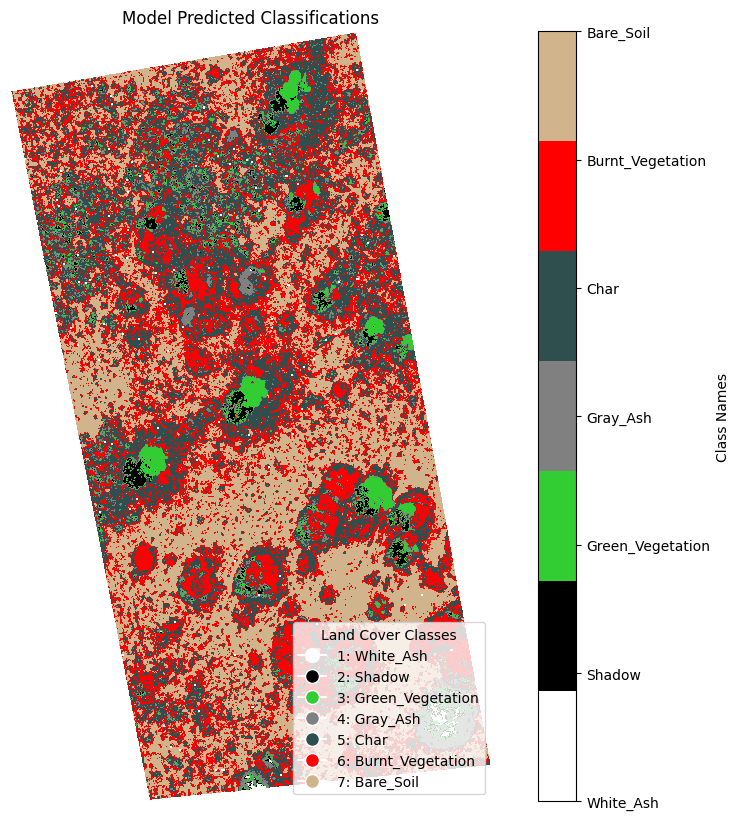

In [41]:
# Path to the test image
test_image_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test.tif'

# Define the class labels and their corresponding names
class_labels = [1, 2, 3, 4, 5, 6, 7]
class_names = ['White_Ash', 'Shadow', 'Green_Vegetation', 'Gray_Ash', 'Char', 'Burnt_Vegetation', 'Bare_Soil']

# Load the predicted classes for the test image
with rasterio.open(test_image_path) as src:
    height, width = src.shape
    pred_image = all_preds.reshape((height, width))

# Define colors for each class
colors = ["white", "black", "limegreen", "grey", "darkslategrey", "red", "tan"]

# Create a custom colormap for visualization
cmap = ListedColormap(colors)

# Convert pred_image to floating-point type
pred_image = pred_image.astype(float)

# Replace NoData value (15) with NaN
pred_image[pred_image == 15] = np.nan

# Plot the predicted classified image
plt.figure(figsize=(12, 10))
img = plt.imshow(pred_image, cmap=cmap, vmin=1, vmax=7)  # Adjust vmin and vmax based on class labels
plt.title('Model Predicted Classifications')

# Add color bar with class labels and numbers
cbar = plt.colorbar(img, ticks=class_labels)
cbar.set_ticklabels(class_names)
cbar.set_label('Class Names')

# Add a legend
legend_labels = [f'{label}: {name}' for label, name in zip(class_labels, class_names)]
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                    for label, color in zip(legend_labels, colors)],
           title='Land Cover Classes', loc='lower right')

# Show the plot
plt.axis('off')
plt.show()

## Lastly, let's reclassify the final image to correlate the land class to its burn severity ranking.

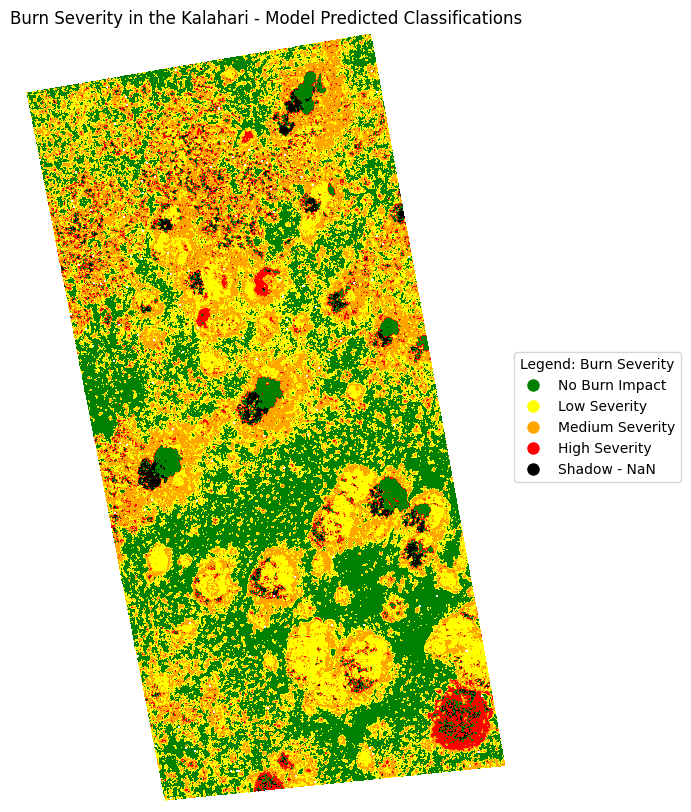

In [43]:
# Path to the test image
test_image_path = r'C:\Users\gille\Desktop\Masters_Drone\area_test.tif'

# Load the predicted classes for the test image
with rasterio.open(test_image_path) as src:
    height, width = src.shape
    pred_image = all_preds.reshape((height, width))

# Create a custom colormap for visualization
colors = ["red", "black", "green", "red", "orange", "yellow", "green"]
cmap = ListedColormap(colors)

# Convert pred_image to floating-point type
pred_image = pred_image.astype(float)

# Replace NoData value (15) with NaN
pred_image[pred_image == 15] = np.nan

# Plot the predicted classified image
plt.figure(figsize=(12, 10))
img = plt.imshow(pred_image, cmap=cmap, vmin=1, vmax=7)  # Adjust vmin and vmax based on your class labels
plt.title('Burn Severity in the Kalahari - Model Predicted Classifications')

# Manually set legend labels and colors
legend_labels = ['No Burn Impact', 'Low Severity', 'Medium Severity', 'High Severity', 'Shadow - NaN']
legend_colors = ['green', 'yellow', 'orange', 'red', 'black']

# Create a manual legend
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                  for label, color in zip(legend_labels, legend_colors)]
plt.legend(handles=legend_handles, title='Legend: Burn Severity', loc='center left', bbox_to_anchor=(1, 0.5))

# Hide the axes
plt.axis('off')

# Show the plot
plt.show()